# Part A

## Imports & Output Directories

In [1]:
import os
import json
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns

import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import (Dense, Conv2D, MaxPooling2D, Flatten,
                                     Dropout, GlobalAveragePooling2D,
                                     BatchNormalization, Input,
                                     MultiHeadAttention, LayerNormalization,
                                     Add, Reshape)
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam

from tensorflow.keras.applications import MobileNetV2, ResNet50, EfficientNetB0
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input as mob_pre
from tensorflow.keras.applications.resnet50   import preprocess_input as res_pre
from tensorflow.keras.applications.efficientnet import preprocess_input as eff_pre

from sklearn.model_selection import train_test_split
from sklearn.metrics import (accuracy_score, log_loss, classification_report,
                             confusion_matrix, roc_curve, auc)
from sklearn.preprocessing import label_binarize

# output directories
base_path  = os.path.join(os.getcwd(), "cassava-leaf-disease-classification")
train_csv  = os.path.join(base_path, "train.csv")
image_dir  = os.path.join(base_path, "train_images")

models_dir = os.path.join("partA_outputs", "models")
plots_dir  = os.path.join("partA_outputs", "plots")

os.makedirs(models_dir, exist_ok=True)
os.makedirs(plots_dir,  exist_ok=True)

## Load CSV & Class Map

In [2]:
df = pd.read_csv(train_csv)
df["filepath"] = df["image_id"].apply(lambda x: os.path.join(image_dir, x))
df["label"]    = df["label"].astype(str)

with open(os.path.join(base_path, "label_num_to_disease_map.json")) as f:
    label_map = json.load(f)

class_names = [label_map[str(i)] for i in range(len(label_map))]
n_classes   = len(class_names)

print("Dataset shape:", df.shape)
print("\nClass distribution:")
print(df["label"].value_counts().rename(index=label_map))
print("\nClass names:", class_names)

Dataset shape: (21397, 3)

Class distribution:
label
Cassava Mosaic Disease (CMD)           13158
Healthy                                 2577
Cassava Green Mottle (CGM)              2386
Cassava Brown Streak Disease (CBSD)     2189
Cassava Bacterial Blight (CBB)          1087
Name: count, dtype: int64

Class names: ['Cassava Bacterial Blight (CBB)', 'Cassava Brown Streak Disease (CBSD)', 'Cassava Green Mottle (CGM)', 'Cassava Mosaic Disease (CMD)', 'Healthy']


## EDA Visualisations

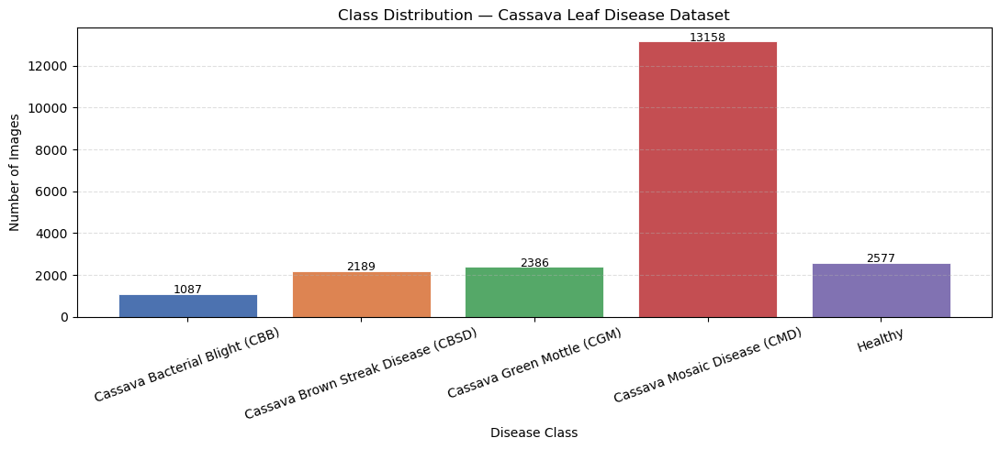

In [3]:
# Class distribution bar chart
counts = df["label"].value_counts().sort_index()
labels_named = [label_map[k] for k in counts.index]

fig, ax = plt.subplots(figsize=(11, 5))
bars = ax.bar(labels_named, counts.values,
              color=["#4C72B0","#DD8452","#55A868","#C44E52","#8172B2"],
              edgecolor="white", linewidth=0.6)
for bar, v in zip(bars, counts.values):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 30,
            str(v), ha="center", fontsize=9)
ax.set_title("Class Distribution — Cassava Leaf Disease Dataset", fontsize=12)
ax.set_xlabel("Disease Class")
ax.set_ylabel("Number of Images")
ax.tick_params(axis="x", rotation=20)
ax.grid(axis="y", linestyle="--", alpha=0.4)
plt.tight_layout()
plt.savefig(os.path.join(plots_dir, "class_distribution.png"), dpi=150, bbox_inches="tight")
plt.show()

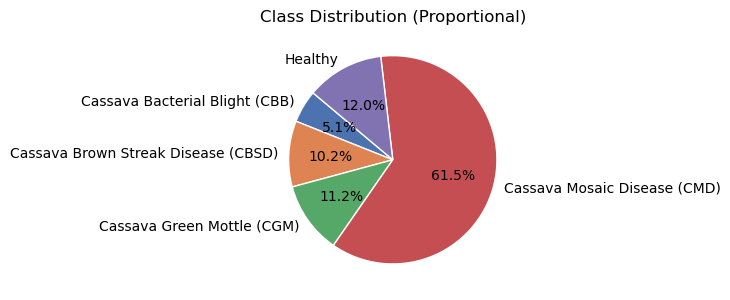

In [4]:
# 2. Class imbalance pie chart 
fig, ax = plt.subplots(figsize=(7, 7))
ax.pie(counts.values, labels=labels_named, autopct="%1.1f%%",
       colors=["#4C72B0","#DD8452","#55A868","#C44E52","#8172B2"],
       startangle=140, wedgeprops={"edgecolor": "white", "linewidth": 1})
ax.set_title("Class Distribution (Proportional)", fontsize=12)
plt.tight_layout()
plt.savefig(os.path.join(plots_dir, "class_pie.png"), dpi=150, bbox_inches="tight")
plt.show()

## Sample Image Grid per Class

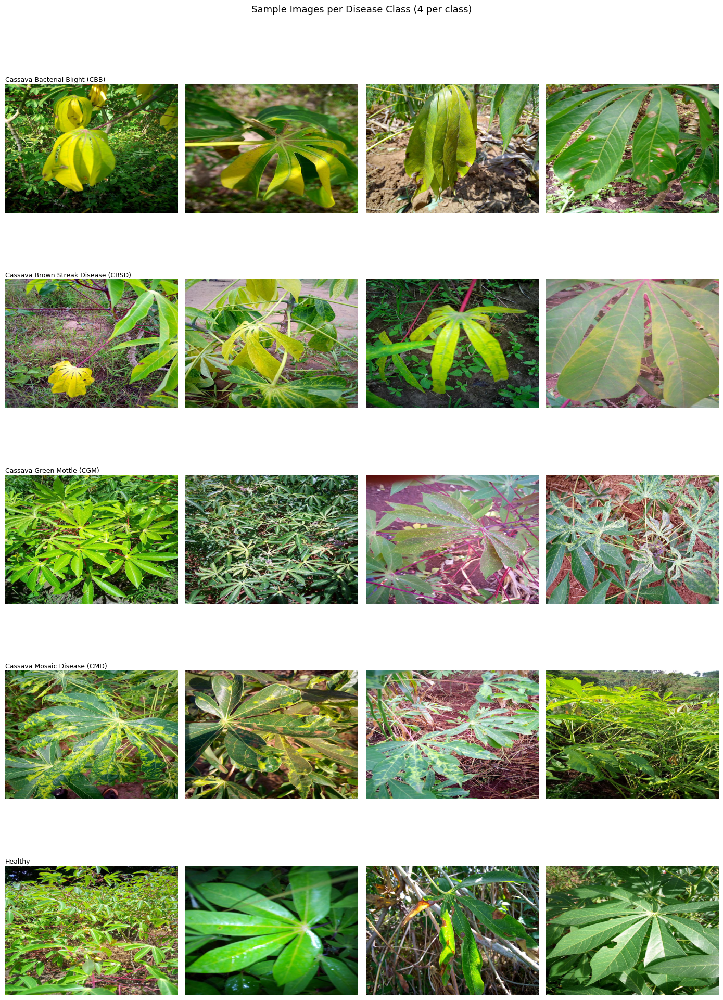

In [5]:
fig, axes = plt.subplots(n_classes, 4, figsize=(14, 4 * n_classes))

for row, cls in enumerate(sorted(df["label"].unique())):
    sample_paths = df[df["label"] == cls]["filepath"].sample(4, random_state=42).values
    for col, path in enumerate(sample_paths):
        img = plt.imread(path)
        axes[row, col].imshow(img)
        axes[row, col].axis("off")
        if col == 0:
            axes[row, col].set_title(label_map[cls], fontsize=9, loc="left", pad=3)

plt.suptitle("Sample Images per Disease Class (4 per class)", fontsize=13, y=1.005)
plt.tight_layout()
plt.savefig(os.path.join(plots_dir, "sample_images_per_class.png"), dpi=120, bbox_inches="tight")
plt.show()

## Train / Val Split & Data Generators

In [6]:
train_df, val_df = train_test_split(
    df, test_size=0.2, stratify=df["label"], random_state=42
)

print(f"Train samples : {len(train_df)}")
print(f"Val   samples : {len(val_df)}")

img_size   = (224, 224)
batch_size = 32

def get_gen(preprocess_fn=None):
    """Return (train_gen, val_gen) with optional backbone preprocessing."""
    train_aug = ImageDataGenerator(
        preprocessing_function=preprocess_fn,
        rescale=None if preprocess_fn else 1.0 / 255,
        rotation_range=20,
        width_shift_range=0.1,
        height_shift_range=0.1,
        zoom_range=0.15,
        horizontal_flip=True,
        vertical_flip=False,
        brightness_range=[0.85, 1.15],
        fill_mode="nearest"
    )
    val_aug = ImageDataGenerator(
        preprocessing_function=preprocess_fn,
        rescale=None if preprocess_fn else 1.0 / 255
    )

    train_flow = train_aug.flow_from_dataframe(
        train_df, x_col="filepath", y_col="label",
        target_size=img_size, batch_size=batch_size,
        class_mode="categorical"
    )
    val_flow = val_aug.flow_from_dataframe(
        val_df, x_col="filepath", y_col="label",
        target_size=img_size, batch_size=batch_size,
        class_mode="categorical", shuffle=False
    )
    return train_flow, val_flow


def get_callbacks(name):
    es  = EarlyStopping(monitor="val_accuracy", patience=5,
                        restore_best_weights=True, verbose=1)
    rlr = ReduceLROnPlateau(monitor="val_loss", factor=0.4,
                            patience=3, min_lr=1e-7, verbose=1)
    return [es, rlr]

Train samples : 17117
Val   samples : 4280


## Augmented Sample Preview

Found 17117 validated image filenames belonging to 5 classes.
Found 4280 validated image filenames belonging to 5 classes.


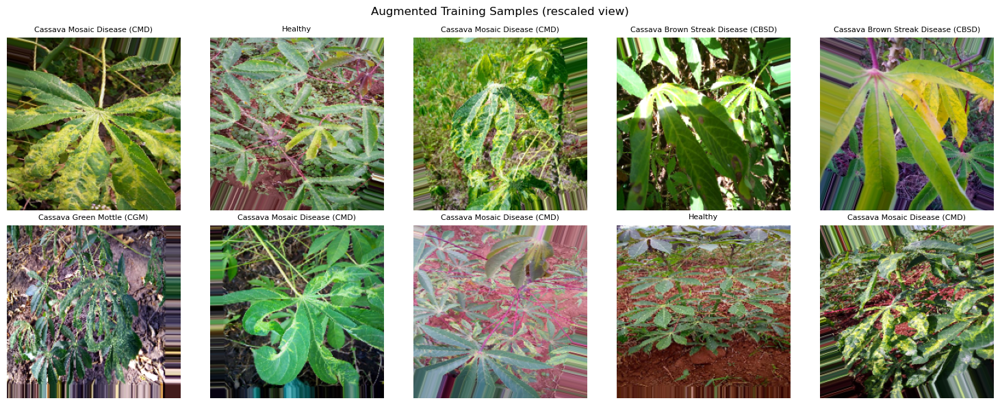

In [7]:
train_preview, _ = get_gen()
x_batch, y_batch = next(train_preview)

fig, axes = plt.subplots(2, 5, figsize=(15, 6))
axes = axes.flatten()
for i in range(10):
    axes[i].imshow(np.clip(x_batch[i], 0, 1))
    axes[i].axis("off")
    cls_idx = np.argmax(y_batch[i])
    axes[i].set_title(class_names[cls_idx], fontsize=8)

plt.suptitle("Augmented Training Samples (rescaled view)", fontsize=12)
plt.tight_layout()
plt.savefig(os.path.join(plots_dir, "augmented_samples.png"), dpi=120, bbox_inches="tight")
plt.show()

## Model 1: Custom CNN

In [8]:
cnn_path = os.path.join(models_dir, "cnn.keras")

train_data, val_data = get_gen()

if os.path.exists(cnn_path):
    print("Loading saved CNN...")
    cnn = tf.keras.models.load_model(cnn_path)
    print("Saved CNN Loaded.")
else:
    print("Training Custom CNN...")

    cnn = Sequential([
        # Block 1
        Conv2D(32, (3, 3), activation="relu", padding="same",
               input_shape=(224, 224, 3)),
        BatchNormalization(),
        Conv2D(32, (3, 3), activation="relu", padding="same"),
        MaxPooling2D(2, 2),
        Dropout(0.25),

        # Block 2
        Conv2D(64, (3, 3), activation="relu", padding="same"),
        BatchNormalization(),
        Conv2D(64, (3, 3), activation="relu", padding="same"),
        MaxPooling2D(2, 2),
        Dropout(0.25),

        # Block 3
        Conv2D(128, (3, 3), activation="relu", padding="same"),
        BatchNormalization(),
        Conv2D(128, (3, 3), activation="relu", padding="same"),
        MaxPooling2D(2, 2),
        Dropout(0.3),

        # Classifier head
        Flatten(),
        Dense(256, activation="relu"),
        BatchNormalization(),
        Dropout(0.4),
        Dense(n_classes, activation="softmax")
    ], name="Custom_CNN")

    cnn.compile(optimizer=Adam(1e-3),
                loss="categorical_crossentropy",
                metrics=["accuracy"])

    cnn.summary()

    h_cnn = cnn.fit(
        train_data, validation_data=val_data,
        epochs=40, callbacks=get_callbacks("cnn")
    )

    cnn.save(cnn_path)
    print("CNN saved.")

Found 17117 validated image filenames belonging to 5 classes.
Found 4280 validated image filenames belonging to 5 classes.
Loading saved CNN...
Saved CNN Loaded.


## Model 2: MobileNetV2 (Transfer Learning)

In [9]:
mob_path = os.path.join(models_dir, "mobilenet.keras")

train_m, val_m = get_gen(mob_pre)

if os.path.exists(mob_path):
    print("Loading saved MobileNetV2...")
    model_m = tf.keras.models.load_model(mob_path)
else:
    print("Training MobileNetV2...")

    base_m = MobileNetV2(weights="imagenet", include_top=False,
                         input_shape=(224, 224, 3))
    base_m.trainable = False

    x   = GlobalAveragePooling2D()(base_m.output)
    x   = Dense(256, activation="relu")(x)
    x   = BatchNormalization()(x)
    x   = Dropout(0.4)(x)
    out = Dense(n_classes, activation="softmax")(x)

    model_m = Model(base_m.input, out, name="MobileNetV2_TL")
    model_m.compile(optimizer=Adam(1e-3),
                    loss="categorical_crossentropy",
                    metrics=["accuracy"])
    model_m.summary()

    h_m = model_m.fit(
        train_m, validation_data=val_m,
        epochs=20, callbacks=get_callbacks("mobilenet")
    )

    model_m.save(mob_path)
    print("MobileNetV2 saved.")

Found 17117 validated image filenames belonging to 5 classes.
Found 4280 validated image filenames belonging to 5 classes.
Loading saved MobileNetV2...


## Model 3: ResNet50 (Transfer Learning)

In [10]:
res_path = os.path.join(models_dir, "resnet50.keras")

train_r, val_r = get_gen(res_pre)

if os.path.exists(res_path):
    print("Loading saved ResNet50...")
    model_r = tf.keras.models.load_model(res_path)
else:
    print("Training ResNet50...")

    base_r = ResNet50(weights="imagenet", include_top=False,
                      input_shape=(224, 224, 3))
    base_r.trainable = False

    x   = GlobalAveragePooling2D()(base_r.output)
    x   = Dense(256, activation="relu")(x)
    x   = BatchNormalization()(x)
    x   = Dropout(0.4)(x)
    out = Dense(n_classes, activation="softmax")(x)

    model_r = Model(base_r.input, out, name="ResNet50_TL")
    model_r.compile(optimizer=Adam(1e-3),
                    loss="categorical_crossentropy",
                    metrics=["accuracy"])
    model_r.summary()

    h_r = model_r.fit(
        train_r, validation_data=val_r,
        epochs=20, callbacks=get_callbacks("resnet")
    )

    model_r.save(res_path)
    print("ResNet50 saved.")

Found 17117 validated image filenames belonging to 5 classes.
Found 4280 validated image filenames belonging to 5 classes.
Loading saved ResNet50...


## Model 4: EfficientNetB0 (Transfer Learning)

In [11]:
eff_path = os.path.join(models_dir, "efficientnet_frozen.keras")

train_e, val_e = get_gen(eff_pre)

if os.path.exists(eff_path):
    print("Loading saved EfficientNetB0...")
    model_e = tf.keras.models.load_model(eff_path)
else:
    print("Training EfficientNetB0 (frozen)...")

    base_e = EfficientNetB0(weights="imagenet", include_top=False,
                            input_shape=(224, 224, 3))
    base_e.trainable = False

    x   = GlobalAveragePooling2D()(base_e.output)
    x   = Dense(256, activation="relu")(x)
    x   = BatchNormalization()(x)
    x   = Dropout(0.4)(x)
    out = Dense(n_classes, activation="softmax")(x)

    model_e = Model(base_e.input, out, name="EfficientNetB0_TL")
    model_e.compile(optimizer=Adam(1e-3),
                    loss="categorical_crossentropy",
                    metrics=["accuracy"])
    model_e.summary()

    h_e = model_e.fit(
        train_e, validation_data=val_e,
        epochs=20, callbacks=get_callbacks("efficientnet")
    )

    model_e.save(eff_path)
    print("EfficientNetB0 saved.")

Found 17117 validated image filenames belonging to 5 classes.
Found 4280 validated image filenames belonging to 5 classes.
Loading saved EfficientNetB0...


## Model 4b: EfficientNetB0 Fine-Tuning

In [12]:
ft_path = os.path.join(models_dir, "efficientnet_finetuned.keras")

if os.path.exists(ft_path):
    print("Loading fine-tuned EfficientNetB0...")
    model_e_ft = tf.keras.models.load_model(ft_path)
else:
    print("Fine-tuning EfficientNetB0 (last 30 layers unfrozen)...")

    base_ft = EfficientNetB0(weights="imagenet", include_top=False,
                              input_shape=(224, 224, 3))

    for layer in base_ft.layers:
        layer.trainable = False
    for layer in base_ft.layers[-30:]:
        layer.trainable = True

    x   = GlobalAveragePooling2D()(base_ft.output)
    x   = Dense(256, activation="relu")(x)
    x   = BatchNormalization()(x)
    x   = Dropout(0.4)(x)
    out = Dense(n_classes, activation="softmax")(x)

    model_e_ft = Model(base_ft.input, out, name="EfficientNetB0_FineTuned")

    model_e_ft.compile(optimizer=Adam(5e-5),
                       loss="categorical_crossentropy",
                       metrics=["accuracy"])

    es_ft  = EarlyStopping(monitor="val_accuracy", patience=5,
                           restore_best_weights=True, verbose=1)
    rlr_ft = ReduceLROnPlateau(monitor="val_loss", factor=0.4,
                               patience=3, min_lr=1e-8, verbose=1)

    h_ft = model_e_ft.fit(
        train_e, validation_data=val_e,
        epochs=20, callbacks=[es_ft, rlr_ft]
    )

    model_e_ft.save(ft_path)
    print("Fine-tuned model saved.")

Loading fine-tuned EfficientNetB0...


## Model 5 (Novel): Vision Transformer (ViT-style Patch Encoder)

In [13]:
# Lightweight Vision Transformer for image classification 
vit_path = os.path.join(models_dir, "vit_novel.keras")

IMG_SIZE   = 224
PATCH_SIZE = 16
NUM_PATCHES = (IMG_SIZE // PATCH_SIZE) ** 2   # 196
PROJ_DIM   = 64
NUM_HEADS  = 4
FF_DIM     = 128
NUM_BLOCKS = 4

def mlp_block(x, hidden_units, dropout_rate):
    for units in hidden_units:
        x = Dense(units, activation="gelu")(x)
        x = Dropout(dropout_rate)(x)
    return x

def patch_encoder(patches, num_patches, proj_dim):
    projected = Dense(proj_dim)(patches)
    positions = tf.range(start=0, limit=num_patches, delta=1)
    pos_embed = tf.keras.layers.Embedding(
        input_dim=num_patches, output_dim=proj_dim)(positions)
    return projected + pos_embed

if os.path.exists(vit_path):
    print("Loading saved ViT model...")
    model_vit = tf.keras.models.load_model(vit_path)
else:
    print("Building Vision Transformer (ViT-style)...")

    inp = Input(shape=(IMG_SIZE, IMG_SIZE, 3))

    patches = Conv2D(filters=PROJ_DIM,
                     kernel_size=PATCH_SIZE,
                     strides=PATCH_SIZE,
                     padding="valid")(inp)          
    patches = Reshape((NUM_PATCHES, PROJ_DIM))(patches)  

    positions = tf.range(start=0, limit=NUM_PATCHES, delta=1)
    pos_embed = tf.keras.layers.Embedding(
        input_dim=NUM_PATCHES, output_dim=PROJ_DIM)(positions)
    x = patches + pos_embed

    for _ in range(NUM_BLOCKS):
        x1   = LayerNormalization(epsilon=1e-6)(x)
        attn = MultiHeadAttention(num_heads=NUM_HEADS,
                                  key_dim=PROJ_DIM // NUM_HEADS,
                                  dropout=0.1)(x1, x1)
        x    = Add()([attn, x])

        x2  = LayerNormalization(epsilon=1e-6)(x)
        mlp = mlp_block(x2, hidden_units=[FF_DIM, PROJ_DIM], dropout_rate=0.1)
        x   = Add()([mlp, x])

    x   = LayerNormalization(epsilon=1e-6)(x)
    x   = tf.keras.layers.GlobalAveragePooling1D()(x)
    x   = Dropout(0.3)(x)
    x   = Dense(64, activation="relu")(x)
    out = Dense(n_classes, activation="softmax")(x)

    model_vit = Model(inp, out, name="ViT_Novel")
    model_vit.compile(optimizer=Adam(5e-4),
                      loss="categorical_crossentropy",
                      metrics=["accuracy"])
    model_vit.summary()

    train_vit, val_vit = get_gen(eff_pre)

    es_vit  = EarlyStopping(monitor="val_accuracy", patience=6,
                            restore_best_weights=True, verbose=1)
    rlr_vit = ReduceLROnPlateau(monitor="val_loss", factor=0.4,
                                patience=3, min_lr=1e-7, verbose=1)

    h_vit = model_vit.fit(
        train_vit, validation_data=val_vit,
        epochs=40, callbacks=[es_vit, rlr_vit]
    )

    model_vit.save(vit_path)
    print("ViT model saved.")

Building Vision Transformer (ViT-style)...


Model: "ViT_Novel"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)      │ (None, 224, 224, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d (Conv2D)               │ (None, 14, 14, 64)        │          49,216 │ input_layer[0][0]          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ reshape (Reshape)             │ (None, 196, 64)           │               0 │ conv2d[0][0]               │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ add (Add)                     │ (None, 196, 64)           │               0 │ reshape[0][0]              │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ layer_normalization           │ (None, 196, 64)           │             128 │ add[0][0]                  │
│ (LayerNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ multi_head_attention          │ (None, 196, 64)           │          16,640 │ layer_normalization[0][0], │
│ (MultiHeadAttention)          │                           │                 │ layer_normalization[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ add_1 (Add)                   │ (None, 196, 64)           │               0 │ multi_head_attention[0][0… │
│                               │                           │                 │ add[0][0]                  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ layer_normalization_1         │ (None, 196, 64)           │             128 │ add_1[0][0]                │
│ (LayerNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense (Dense)                 │ (None, 196, 128)          │           8,320 │ layer_normalization_1[0][… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dropout_1 (Dropout)           │ (None, 196, 128)          │               0 │ dense[0][0]                │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_1 (Dense)               │ (None, 196, 64)           │           8,256 │ dropout_1[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dropout_2 (Dropout)           │ (None, 196, 64)           │               0 │ dense_1[0][0]              │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ add_2 (Add)                   │ (None, 196, 64)           │               0 │ dropout_2[0][0],           │
│                               │                           │                 │ add_1[0][0]                │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ layer_normalization_2         │ (None, 196, 64)           │             128 │ add_2[0][0]                │
│ (LayerNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼───────────────

 Total params: 187,717 (733.27 KB)

 Trainable params: 187,717 (733.27 KB)

 Non-trainable params: 0 (0.00 B)

Found 17117 validated image filenames belonging to 5 classes.
Found 4280 validated image filenames belonging to 5 classes.
Epoch 1/40
535/535 ━━━━━━━━━━━━━━━━━━━━ 1201s 2s/step - accuracy: 0.6124 - loss: 1.2121 - val_accuracy: 0.6150 - val_loss: 1.1793 - learning_rate: 5.0000e-04
Epoch 2/40
535/535 ━━━━━━━━━━━━━━━━━━━━ 1248s 2s/step - accuracy: 0.6149 - loss: 1.1920 - val_accuracy: 0.6150 - val_loss: 1.1781 - learning_rate: 5.0000e-04
Epoch 3/40
535/535 ━━━━━━━━━━━━━━━━━━━━ 1300s 2s/step - accuracy: 0.6149 - loss: 1.1872 - val_accuracy: 0.6150 - val_loss: 1.1774 - learning_rate: 5.0000e-04
Epoch 4/40
535/535 ━━━━━━━━━━━━━━━━━━━━ 1132s 2s/step - accuracy: 0.6149 - loss: 1.1816 - val_accuracy: 0.6150 - val_loss: 1.1722 - learning_rate: 5.0000e-04
Epoch 5/40
535/535 ━━━━━━━━━━━━━━━━━━━━ 742s 1s/step - accuracy: 0.6149 - loss: 1.1724 - val_accuracy: 0.6150 - val_loss: 1.1489 - learning_rate: 5.0000e-04
Epoch 6/40
535/535 ━━━━━━━━━━━━━━━━━━━━ 813s 2s/step - accuracy: 0.6168 - loss: 1.1406 -

## Rebuild Generators for Evaluation

In [14]:
train_data, val_data = get_gen()
train_m,    val_m    = get_gen(mob_pre)
train_r,    val_r    = get_gen(res_pre)
train_e,    val_e    = get_gen(eff_pre)
train_vit,  val_vit  = get_gen(eff_pre)

Found 17117 validated image filenames belonging to 5 classes.
Found 4280 validated image filenames belonging to 5 classes.
Found 17117 validated image filenames belonging to 5 classes.
Found 4280 validated image filenames belonging to 5 classes.
Found 17117 validated image filenames belonging to 5 classes.
Found 4280 validated image filenames belonging to 5 classes.
Found 17117 validated image filenames belonging to 5 classes.
Found 4280 validated image filenames belonging to 5 classes.
Found 17117 validated image filenames belonging to 5 classes.
Found 4280 validated image filenames belonging to 5 classes.


## Evaluate All Models

In [15]:
all_models  = [cnn, model_m, model_r, model_e, model_e_ft, model_vit]
all_val_gens = [val_data, val_m, val_r, val_e, val_e, val_vit]
model_names = ["Custom CNN", "MobileNetV2", "ResNet50",
               "EfficientNet", "EfficientNet-FT", "ViT (Novel)"]

accs, losses, pred_prob_list, y_true_list = [], [], [], []

for name, model, gen in zip(model_names, all_models, all_val_gens):
    probs   = model.predict(gen, verbose=0)
    y_true  = gen.classes
    y_pred  = np.argmax(probs, axis=1)

    acc = accuracy_score(y_true, y_pred)
    ll  = log_loss(y_true, probs)

    accs.append(acc)
    losses.append(ll)
    pred_prob_list.append(probs)
    y_true_list.append(y_true)

    print(f"{name:20s}  Accuracy={acc:.4f}   LogLoss={ll:.4f}")

metrics_df = pd.DataFrame({
    "Model":    model_names,
    "Accuracy": accs,
    "LogLoss":  losses
}).set_index("Model")

print("\n", metrics_df.round(4).to_string())

Custom CNN            Accuracy=0.8107   LogLoss=0.5347
MobileNetV2           Accuracy=0.7250   LogLoss=0.7609
ResNet50              Accuracy=0.7411   LogLoss=0.7323
EfficientNet          Accuracy=0.7535   LogLoss=0.6907
EfficientNet-FT       Accuracy=0.7914   LogLoss=0.6376
ViT (Novel)           Accuracy=0.6773   LogLoss=0.8808

                  Accuracy  LogLoss
Model                             
Custom CNN         0.8107   0.5347
MobileNetV2        0.7250   0.7609
ResNet50           0.7411   0.7323
EfficientNet       0.7535   0.6907
EfficientNet-FT    0.7914   0.6376
ViT (Novel)        0.6773   0.8808


## Training Loss Curves

In [16]:
# Collecting all training histories in one dict
try:
    histories = {
        "Custom CNN":       h_cnn,
        "MobileNetV2":      h_m,
        "ResNet50":         h_r,
        "EfficientNet":     h_e,
        "EfficientNet-FT":  h_ft,
        "ViT (Novel)":      h_vit,
    }

    fig, axes = plt.subplots(2, 3, figsize=(16, 9))
    axes = axes.flatten()

    for ax, (name, hist) in zip(axes, histories.items()):
        ax.plot(hist.history["accuracy"],     label="Train Acc", linewidth=1.2)
        ax.plot(hist.history["val_accuracy"], label="Val Acc",   linewidth=1.2,
                linestyle="--")
        ax.set_title(f"{name}", fontsize=10)
        ax.set_xlabel("Epoch")
        ax.set_ylabel("Accuracy")
        ax.legend(fontsize=8)
        ax.grid(True, alpha=0.3)

    plt.suptitle("Training vs Validation Accuracy — All Models", fontsize=13)
    plt.tight_layout()
    plt.savefig(os.path.join(plots_dir, "loss_curves_all.png"), dpi=150, bbox_inches="tight")
    plt.show()

except NameError:
    print("Training histories not available (models loaded from disk). Skipping loss curves.")

Training histories not available (models loaded from disk). Skipping loss curves.


## Accuracy & Loss Comparison Bar Charts

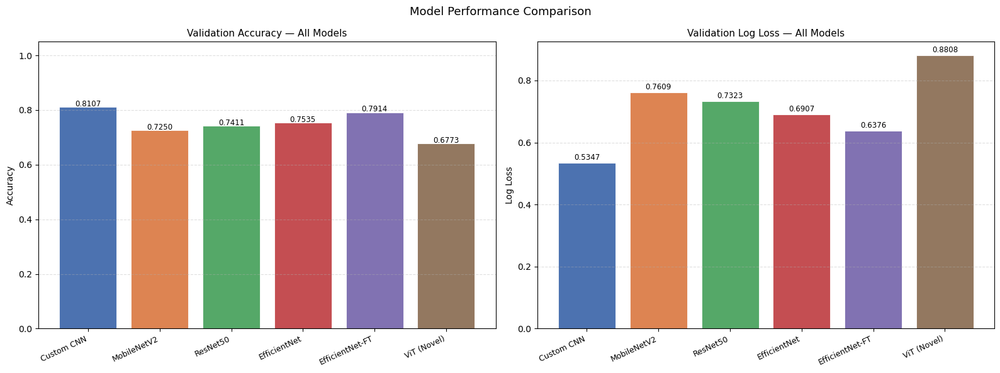

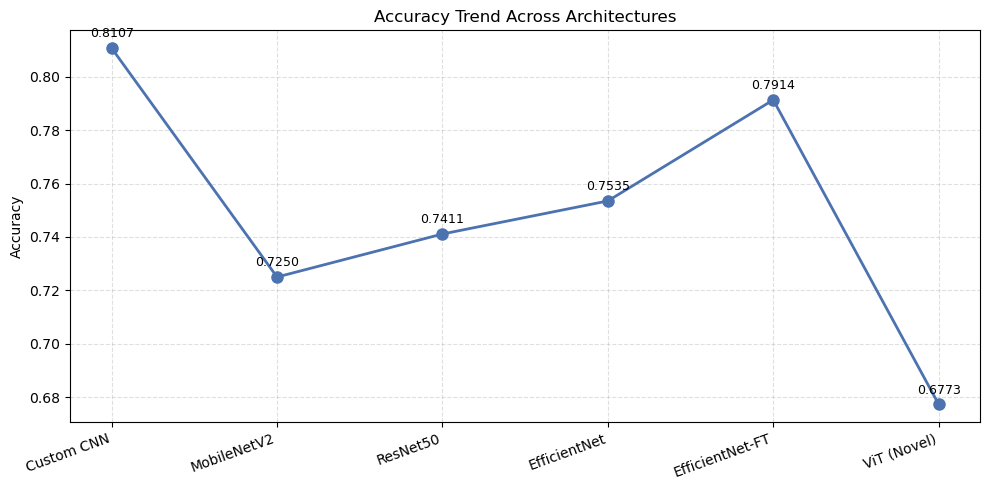

In [17]:
colors = ["#4C72B0","#DD8452","#55A868","#C44E52","#8172B2","#937860"]

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Accuracy
bars = axes[0].bar(model_names, accs, color=colors, edgecolor="white", linewidth=0.6)
for bar, v in zip(bars, accs):
    axes[0].text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.003,
                 f"{v:.4f}", ha="center", fontsize=8.5)
axes[0].set_title("Validation Accuracy — All Models", fontsize=11)
axes[0].set_ylabel("Accuracy")
axes[0].set_xticklabels(model_names, rotation=25, ha="right", fontsize=9)
axes[0].set_ylim(0, 1.05)
axes[0].grid(axis="y", linestyle="--", alpha=0.4)

# Log Loss
bars = axes[1].bar(model_names, losses, color=colors, edgecolor="white", linewidth=0.6)
for bar, v in zip(bars, losses):
    axes[1].text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.01,
                 f"{v:.4f}", ha="center", fontsize=8.5)
axes[1].set_title("Validation Log Loss — All Models", fontsize=11)
axes[1].set_ylabel("Log Loss")
axes[1].set_xticklabels(model_names, rotation=25, ha="right", fontsize=9)
axes[1].grid(axis="y", linestyle="--", alpha=0.4)

plt.suptitle("Model Performance Comparison", fontsize=13)
plt.tight_layout()
plt.savefig(os.path.join(plots_dir, "model_comparison_bars.png"), dpi=150, bbox_inches="tight")
plt.show()

# Accuracy trend line
fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(model_names, accs, marker="o", linewidth=2, color="#4C72B0", markersize=8)
for i, v in enumerate(accs):
    ax.text(i, v + 0.004, f"{v:.4f}", ha="center", fontsize=9)
ax.set_title("Accuracy Trend Across Architectures", fontsize=12)
ax.set_ylabel("Accuracy")
ax.set_xticklabels(model_names, rotation=20, ha="right")
ax.grid(True, linestyle="--", alpha=0.4)
plt.tight_layout()
plt.savefig(os.path.join(plots_dir, "accuracy_trend.png"), dpi=150, bbox_inches="tight")
plt.show()

## Detailed Classification Report & Confusion Matrix (Best Model)

In [18]:
# Use the best-performing model for detailed per-class analysis
best_idx   = int(np.argmax(accs))
best_name  = model_names[best_idx]
best_probs = pred_prob_list[best_idx]
best_ytrue = y_true_list[best_idx]
best_ypred = np.argmax(best_probs, axis=1)

print(f"Best model: {best_name}  (Accuracy = {accs[best_idx]:.4f})\n")
report = classification_report(best_ytrue, best_ypred,
                                target_names=class_names, digits=4)
print(report)

with open(os.path.join("partA_outputs", "classification_report.txt"), "w") as f:
    f.write(f"Best Model: {best_name}\n\n")
    f.write(report)

Best model: Custom CNN  (Accuracy = 0.8107)

                                     precision    recall  f1-score   support

     Cassava Bacterial Blight (CBB)     0.5312    0.2350    0.3259       217
Cassava Brown Streak Disease (CBSD)     0.5975    0.7694    0.6727       438
         Cassava Green Mottle (CGM)     0.6860    0.6688    0.6773       477
       Cassava Mosaic Disease (CMD)     0.9459    0.9107    0.9280      2632
                            Healthy     0.5894    0.7093    0.6438       516

                           accuracy                         0.8107      4280
                          macro avg     0.6700    0.6586    0.6495      4280
                       weighted avg     0.8173    0.8107    0.8091      4280



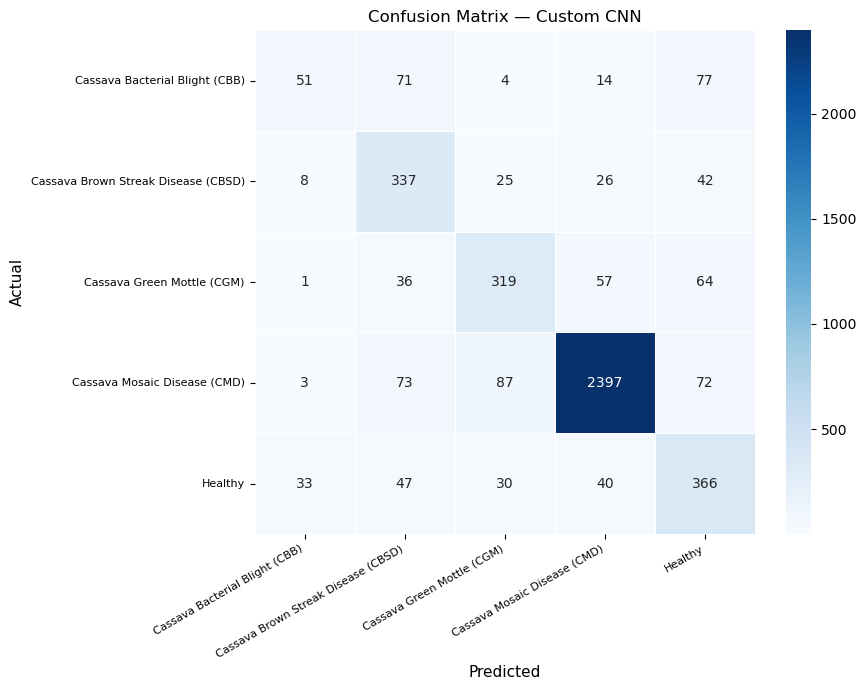

In [19]:
# Confusion matrix
cm = confusion_matrix(best_ytrue, best_ypred)

fig, ax = plt.subplots(figsize=(9, 7))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_names, yticklabels=class_names,
            ax=ax, linewidths=0.5)
ax.set_xlabel("Predicted", fontsize=11)
ax.set_ylabel("Actual",    fontsize=11)
ax.set_title(f"Confusion Matrix — {best_name}", fontsize=12)
ax.set_xticklabels(class_names, rotation=30, ha="right", fontsize=8)
ax.set_yticklabels(class_names, rotation=0,  fontsize=8)
plt.tight_layout()
plt.savefig(os.path.join(plots_dir, "confusion_matrix.png"), dpi=150, bbox_inches="tight")
plt.show()

## Per-Class Precision / Recall / F1 Charts

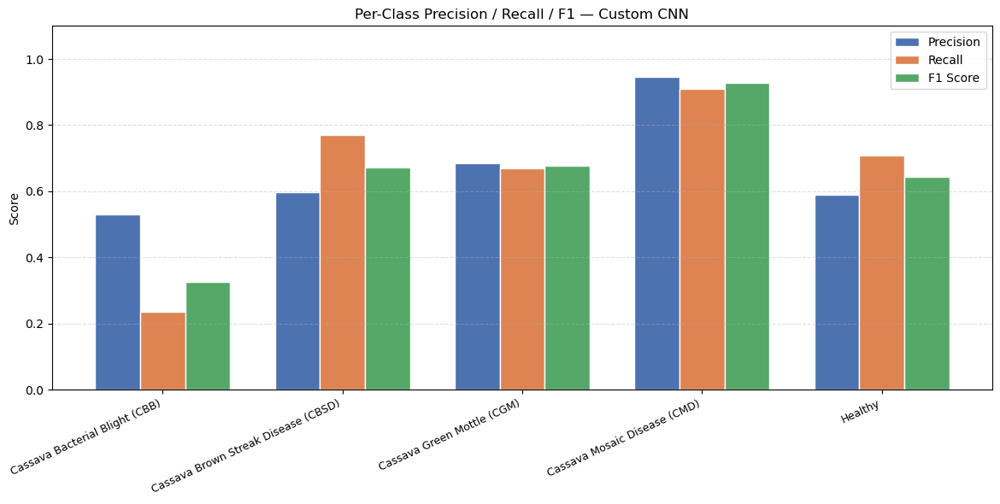

In [20]:
report_dict = classification_report(best_ytrue, best_ypred,
                                     target_names=class_names,
                                     output_dict=True)

precision = [report_dict[c]["precision"] for c in class_names]
recall    = [report_dict[c]["recall"]    for c in class_names]
f1        = [report_dict[c]["f1-score"]  for c in class_names]

x = np.arange(len(class_names))
w = 0.25

fig, ax = plt.subplots(figsize=(12, 6))
ax.bar(x - w,   precision, width=w, label="Precision", color="#4C72B0", edgecolor="white")
ax.bar(x,       recall,    width=w, label="Recall",    color="#DD8452", edgecolor="white")
ax.bar(x + w,   f1,        width=w, label="F1 Score",  color="#55A868", edgecolor="white")
ax.set_xticks(x)
ax.set_xticklabels(class_names, rotation=25, ha="right", fontsize=9)
ax.set_ylim(0, 1.1)
ax.set_ylabel("Score")
ax.set_title(f"Per-Class Precision / Recall / F1 — {best_name}", fontsize=12)
ax.legend()
ax.grid(axis="y", linestyle="--", alpha=0.4)
plt.tight_layout()
plt.savefig(os.path.join(plots_dir, "per_class_prf.png"), dpi=150, bbox_inches="tight")
plt.show()

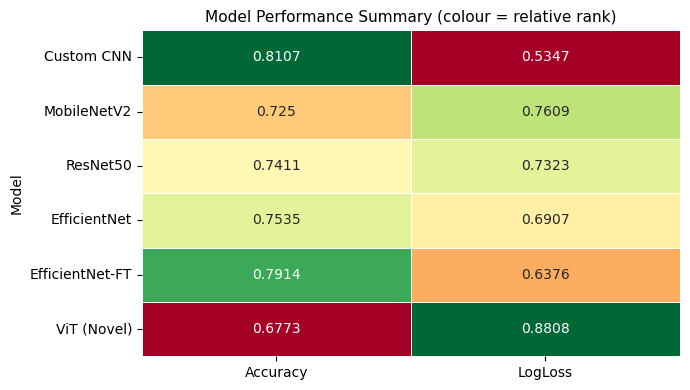

In [21]:
# Heatmap summary across all models 
heat_data = pd.DataFrame({
    "Model":    model_names,
    "Accuracy": [round(v, 4) for v in accs],
    "LogLoss":  [round(v, 4) for v in losses]
}).set_index("Model")

fig, ax = plt.subplots(figsize=(7, 4))
norm = (heat_data - heat_data.min()) / (heat_data.max() - heat_data.min() + 1e-9)
sns.heatmap(norm, annot=heat_data, fmt="", cmap="RdYlGn",
            ax=ax, linewidths=0.5, cbar=False, annot_kws={"size": 10})
ax.set_title("Model Performance Summary (colour = relative rank)", fontsize=11)
plt.tight_layout()
plt.savefig(os.path.join(plots_dir, "metrics_heatmap.png"), dpi=150, bbox_inches="tight")
plt.show()

## ROC Curves (Multi-class)

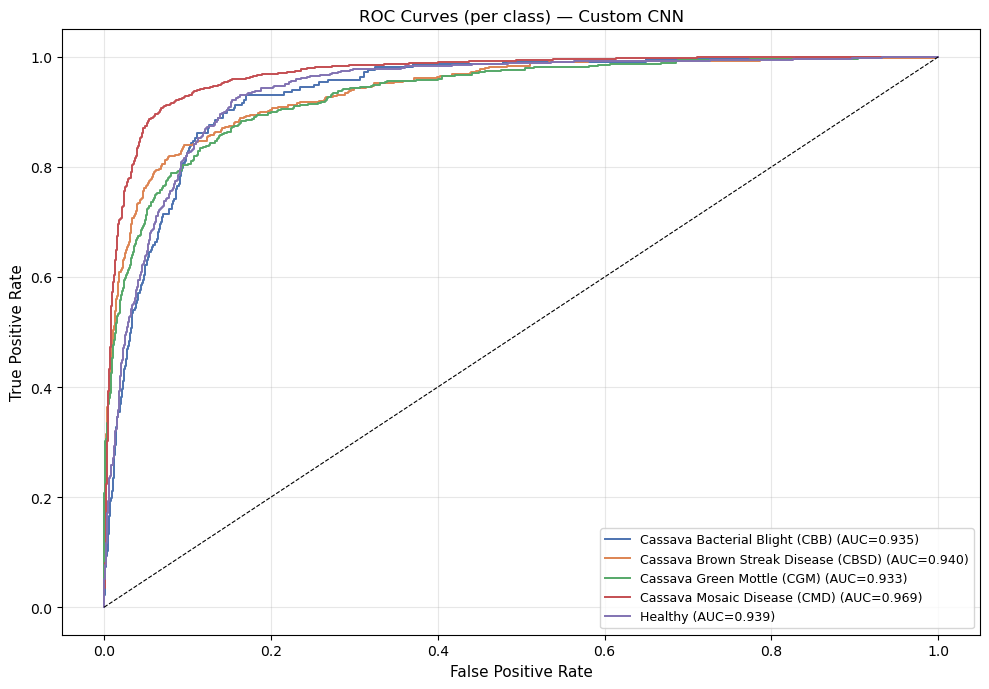

In [22]:
y_true_bin = label_binarize(best_ytrue, classes=list(range(n_classes)))
y_score    = best_probs

colors_roc = ["#4C72B0","#DD8452","#55A868","#C44E52","#8172B2"]

# Per-class ROC
fig, ax = plt.subplots(figsize=(10, 7))
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_score[:, i])
    roc_auc     = auc(fpr, tpr)
    ax.plot(fpr, tpr, label=f"{class_names[i]} (AUC={roc_auc:.3f})",
            color=colors_roc[i], linewidth=1.4)

ax.plot([0, 1], [0, 1], "k--", linewidth=0.8)
ax.set_xlabel("False Positive Rate", fontsize=11)
ax.set_ylabel("True Positive Rate",  fontsize=11)
ax.set_title(f"ROC Curves (per class) — {best_name}", fontsize=12)
ax.legend(loc="lower right", fontsize=9)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(plots_dir, "roc_per_class.png"), dpi=150, bbox_inches="tight")
plt.show()

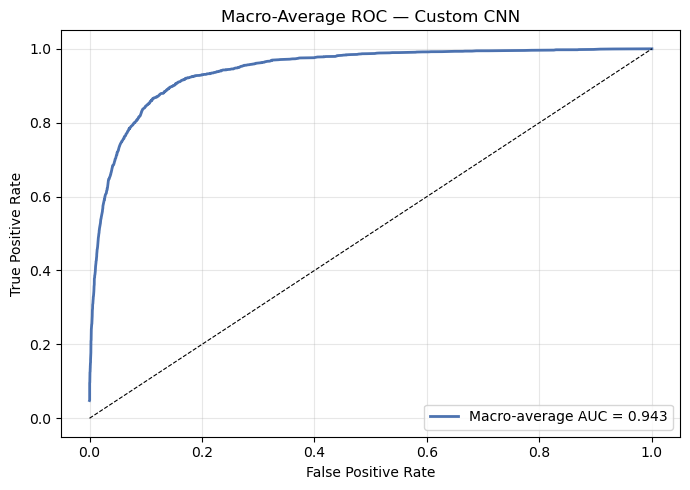

In [23]:
# Macro-average ROC
all_fpr  = np.unique(np.concatenate(
    [roc_curve(y_true_bin[:, i], y_score[:, i])[0] for i in range(n_classes)]
))
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_score[:, i])
    mean_tpr   += np.interp(all_fpr, fpr, tpr)
mean_tpr  /= n_classes
macro_auc  = auc(all_fpr, mean_tpr)

fig, ax = plt.subplots(figsize=(7, 5))
ax.plot(all_fpr, mean_tpr, color="#4C72B0", linewidth=2,
        label=f"Macro-average AUC = {macro_auc:.3f}")
ax.plot([0, 1], [0, 1], "k--", linewidth=0.8)
ax.set_xlabel("False Positive Rate")
ax.set_ylabel("True Positive Rate")
ax.set_title(f"Macro-Average ROC — {best_name}", fontsize=12)
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(plots_dir, "roc_macro.png"), dpi=150, bbox_inches="tight")
plt.show()

## Prediction Confidence & Sample Prediction Grid

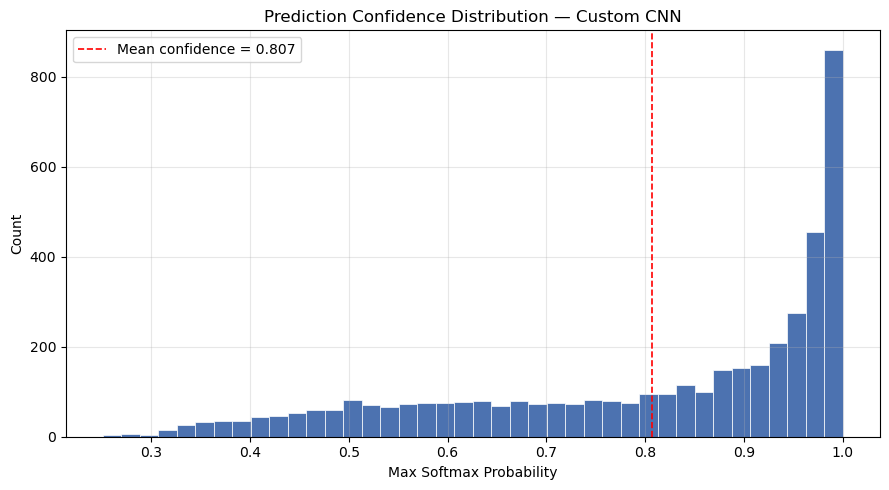

In [24]:
# Confidence distribution 
conf = np.max(best_probs, axis=1)

fig, ax = plt.subplots(figsize=(9, 5))
ax.hist(conf, bins=40, color="#4C72B0", edgecolor="white", linewidth=0.5)
ax.axvline(conf.mean(), color="red", linestyle="--", linewidth=1.2,
           label=f"Mean confidence = {conf.mean():.3f}")
ax.set_title(f"Prediction Confidence Distribution — {best_name}", fontsize=12)
ax.set_xlabel("Max Softmax Probability")
ax.set_ylabel("Count")
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(plots_dir, "confidence_distribution.png"), dpi=150, bbox_inches="tight")
plt.show()

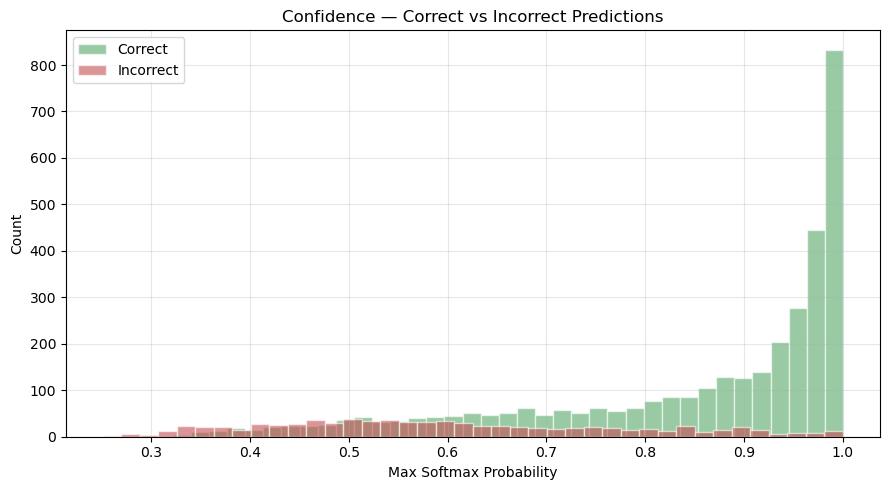

In [25]:
# Correct vs incorrect confidence split
correct   = conf[best_ypred == best_ytrue]
incorrect = conf[best_ypred != best_ytrue]

fig, ax = plt.subplots(figsize=(9, 5))
ax.hist(correct,   bins=40, alpha=0.6, label="Correct",   color="#55A868", edgecolor="white")
ax.hist(incorrect, bins=40, alpha=0.6, label="Incorrect", color="#C44E52", edgecolor="white")
ax.set_title("Confidence — Correct vs Incorrect Predictions", fontsize=12)
ax.set_xlabel("Max Softmax Probability")
ax.set_ylabel("Count")
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(plots_dir, "confidence_correct_incorrect.png"), dpi=150, bbox_inches="tight")
plt.show()

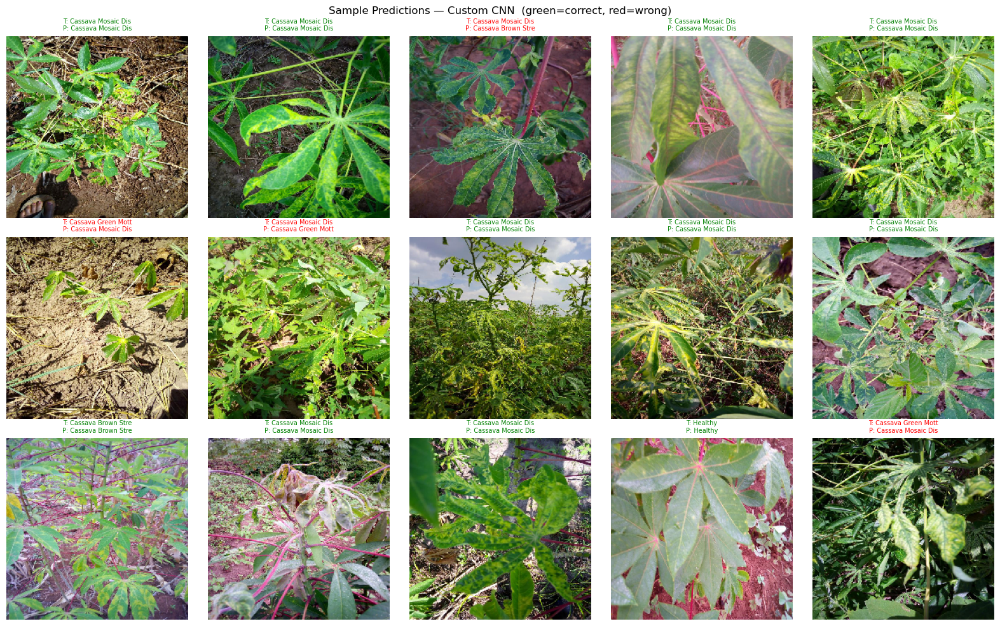

In [26]:
#  Sample prediction grid 
best_gen    = all_val_gens[best_idx]
images_b, labels_b = next(best_gen)
preds_b     = np.argmax(all_models[best_idx].predict(images_b, verbose=0), axis=1)
trues_b     = np.argmax(labels_b, axis=1)

fig, axes = plt.subplots(3, 5, figsize=(16, 10))
axes = axes.flatten()

for i in range(15):
    img = images_b[i]
    if img.min() < 0:          # undo [-1,1] normalisation for display
        img = (img + 1) / 2.0
    img = np.clip(img, 0, 1)

    axes[i].imshow(img)
    axes[i].axis("off")

    true_label = class_names[trues_b[i]]
    pred_label = class_names[preds_b[i]]
    color      = "green" if trues_b[i] == preds_b[i] else "red"

    axes[i].set_title(
        f"T: {true_label[:18]}\nP: {pred_label[:18]}",
        fontsize=7, color=color
    )

plt.suptitle(f"Sample Predictions — {best_name}  (green=correct, red=wrong)",
             fontsize=12)
plt.tight_layout()
plt.savefig(os.path.join(plots_dir, "sample_predictions.png"), dpi=120, bbox_inches="tight")
plt.show()

## Save All Models & Final Summary

In [27]:
# Models are already saved incrementally during training.
expected_files = {
    "cnn.keras":                    "Custom CNN",
    "mobilenet.keras":              "MobileNetV2",
    "resnet50.keras":               "ResNet50",
    "efficientnet_frozen.keras":    "EfficientNetB0 (frozen)",
    "efficientnet_finetuned.keras": "EfficientNetB0 (fine-tuned)",
    "vit_novel.keras":              "ViT (Novel)",
}

print("=== Saved Models ===")
for fname, desc in expected_files.items():
    path     = os.path.join(models_dir, fname)
    exists   = os.path.exists(path)
    size_kb  = os.path.getsize(path) / 1024 if exists else 0
    status   = f"{size_kb:8.1f} KB" if exists else "  MISSING"
    print(f"  {desc:30s}  {fname:35s}  {status}")

print("\nFinal Performance Summary")
print(metrics_df.round(4).to_string())
print(f"\nBest model: {best_name}  "
      f"(Accuracy={accs[best_idx]:.4f}, LogLoss={losses[best_idx]:.4f})")

print("\Saved Plots")
for f in sorted(os.listdir(plots_dir)):
    print(f"  {f}")

=== Saved Models ===
  Custom CNN                      cnn.keras                            304543.4 KB
  MobileNetV2                     mobilenet.keras                       13267.3 KB
  ResNet50                        resnet50.keras                        98959.0 KB
  EfficientNetB0 (frozen)         efficientnet_frozen.keras             20515.7 KB
  EfficientNetB0 (fine-tuned)     efficientnet_finetuned.keras          32224.2 KB
  ViT (Novel)                     vit_novel.keras                        2723.4 KB

Final Performance Summary
                 Accuracy  LogLoss
Model                             
Custom CNN         0.8107   0.5347
MobileNetV2        0.7250   0.7609
ResNet50           0.7411   0.7323
EfficientNet       0.7535   0.6907
EfficientNet-FT    0.7914   0.6376
ViT (Novel)        0.6773   0.8808

Best model: Custom CNN  (Accuracy=0.8107, LogLoss=0.5347)
\Saved Plots
  accuracy_trend.png
  augmented_samples.png
  class_distribution.png
  class_pie.png
  confidence_cor